# Visualizing the Convolutional Layers

A convolutional neural network typically has multiple convolutional layers (hence, the name).

Conceptually, we understand each convolutional layer extracts spatial features from their inputs.  Earlier layer detects low-level features like color, texture, lines, curves, etc.  Later layers detect higher abstraction like eyes, tail, etc.

But we can't see them visually.  Or, can we?

In this notebook, we use a pre-trained convolutional neural network to see what kind of input images strongly activate filters in convolutional layers.

This notebook code is largely based on the blog article **How convolutional neural networks see the world** by **Francois Chollet** [2].

## Pre-trained VGG 16

We use the pre-trained VGG16 available in Keras.  We could use any other convolutional neural network.

The details of VGG 16 is in **Very Deep Convolutional Networks for Large-Scale Image Recognition** by **Karen Simonyan, Andrew Zisserman** [1].


In [1]:
import numpy as np
import keras.backend as K
from keras.applications.vgg16 import VGG16
import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


The following shows the available convolutional layers in VGG16.

In [2]:
model = VGG16(include_top=False)
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

The output shapes all begin with (None, None, None).  It is because we didn't specify the input shape.  In other words, the model can handle any image shape. 

The last dimension of each output shape is the number of filters (channels).  For example, the layer 'block5_conv1' has 512 filters (indexed from 0 to 511).

## A Random Image as Input

Typically, the input to the VGG16 model is an image to classify such as cats and dogs.  Here, however, we use a randomly generated noise image and feed it to VGG16 model to calculate filter activations and their gradients.

In [3]:
def make_random_image(img_height=128, img_width=128, mean=127, std=10):
    return np.random.normal(loc=mean, scale=std, size=(img_height, img_width, 3))

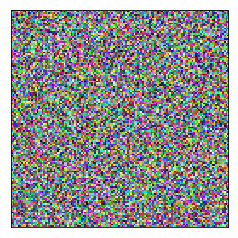

In [4]:
random_img = make_random_image()

plt.imshow(random_img)
plt.xticks([])
plt.yticks([])
plt.show()

## Nudge the Random Image to Activate the Filter Strongly

We can calculate the activation of a filter with the random image.  Most likely, the activations are not very strong.

However, using the gradients, we adjust the image data to make the activation stronger.  In other words, we nudge the input image pixel values to increase the activation using the gradients as our guide.  It is a gradient ascent process in that we maximize the activation by adjusting the input image.

After some repetition of this process, the output tells us what kind of image triggers the filter to activate strongly, through which we can have some insight into what kind of things the filter detects.

In [5]:
# find a layer object given a model and layer name
# alternatively, we could construct a dictionary
# of layer name to layer object.
def find_layer(model, layer_name):
    for layer in model.layers:
        if layer.name == layer_name:
            return layer
    return None

In [6]:
# convert result data into 0-255 image data
def as_image(x):
    # normalize data
    x -= x.mean()
    x /= (x.std() + 1e-5)
    # set the std to 0.1 and the mean to 0.5
    x *= 0.1
    x += 0.5
    # scale data and clip between 0 and 255 like an image data
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [7]:
def layer_image(model, layer_name, filter_index, input_img, steps=20, step_size=1.0):
    layer = find_layer(model, layer_name)
    
    # we want to maximize the mean activation of the filter of the layer
    activation = K.mean(layer.output[:, :, :, filter_index])
    
    # the gradients of the activations of the filter of the layer
    grads = K.gradients(activation, model.input)[0]
    
    # normalize the gradients to avoid very small/large gradients
    grads /= K.sqrt(K.mean(K.square(grads))) + 1e-5
    
    # calculate the mean activation and the gradients which depend on the mean activation
    calculate = K.function([model.input], [activation, grads])
        
    # adjust input image suitable for the calculate function
    input_img = np.copy(input_img)    # make a copy to preserve the original
    input_img = np.float64(input_img) # make sure it's float type
    input_data = input_img.reshape((1, *input_img.shape)) # reshape to one record image data

    # maximize the activation using the gradient ascent
    # (nudge the image data with the gradients)
    for i in range(steps):
        _, grads_value = calculate([input_data])
        input_data += grads_value * step_size
    result = input_data[0]
    
    return as_image(result)

The following is an example of an input image that strongly activates the first filter in the layer 'block4_conv1'.

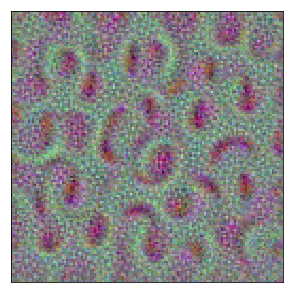

In [8]:
result = layer_image(model, layer_name='block4_conv1', filter_index=0, input_img=random_img)

plt.figure(figsize=(15,5))
plt.imshow(result)
plt.xticks([])
plt.yticks([])
plt.show()

Let's examine some filters in each layer.

In [9]:
def show_filters(layer_name, input_img):
    print(layer_name)
    plt.figure(figsize=(25,5))
    for i in range(20):
        result = layer_image(model, layer_name, filter_index=i, input_img=input_img)    
        plt.subplot(2, 10, i+1)
        plt.imshow(result)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show()

block1_conv1


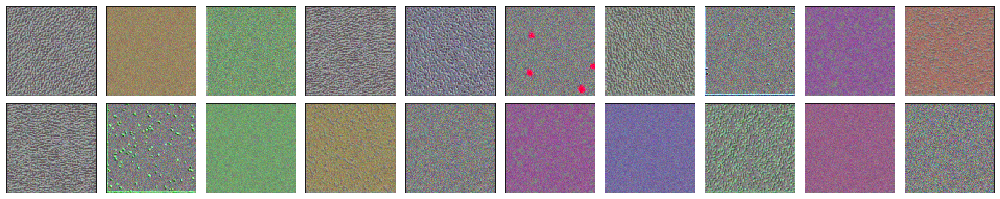

block1_conv2


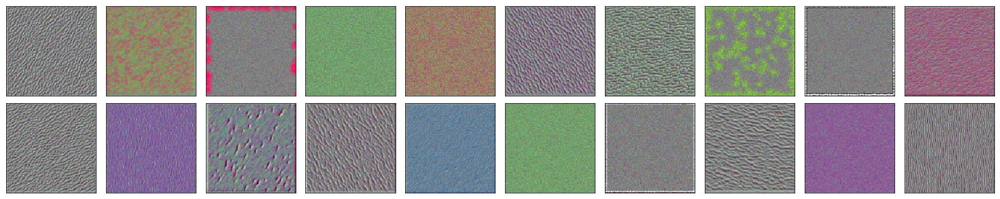

In [10]:
show_filters('block1_conv1', random_img)
show_filters('block1_conv2', random_img)

block2_conv1


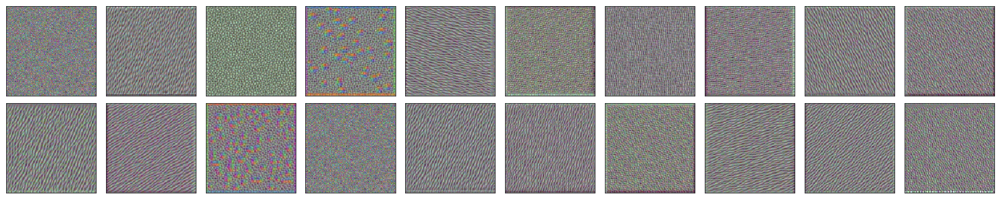

block2_conv2


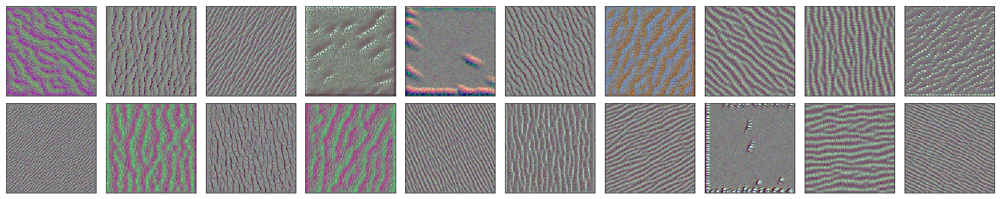

In [11]:
show_filters('block2_conv1', random_img)
show_filters('block2_conv2', random_img)

block3_conv1


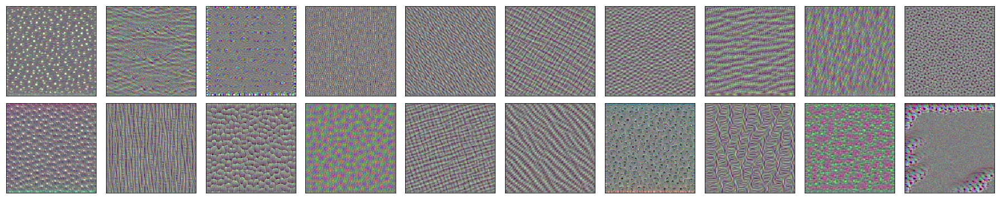

block3_conv2


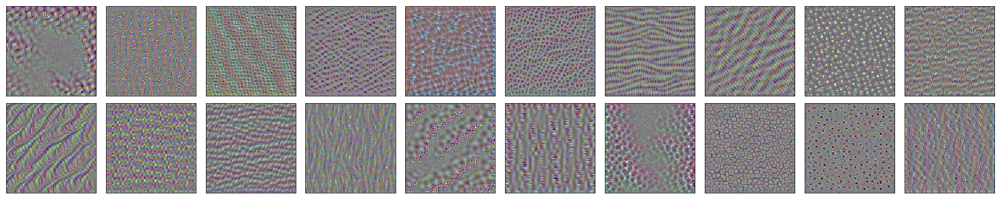

block3_conv3


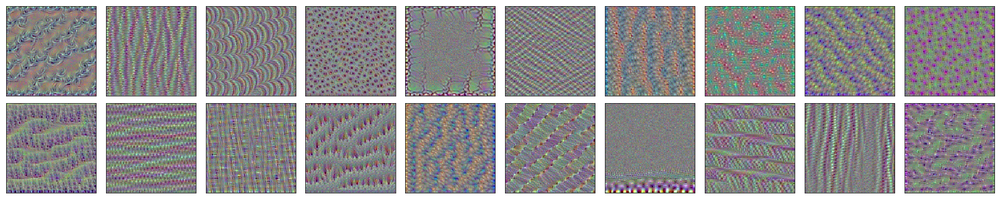

In [12]:
show_filters('block3_conv1', random_img)
show_filters('block3_conv2', random_img)
show_filters('block3_conv3', random_img)

block4_conv1


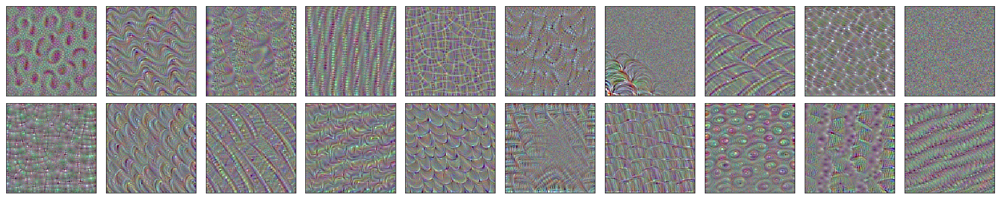

block4_conv2


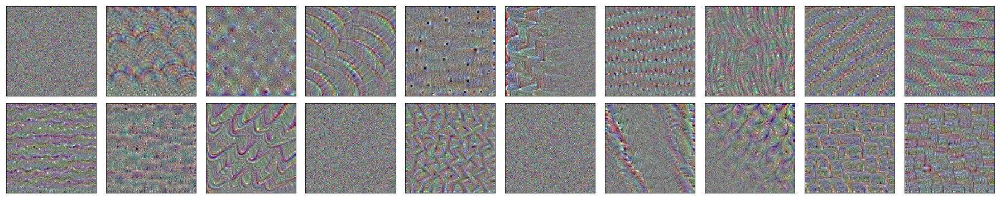

block4_conv3


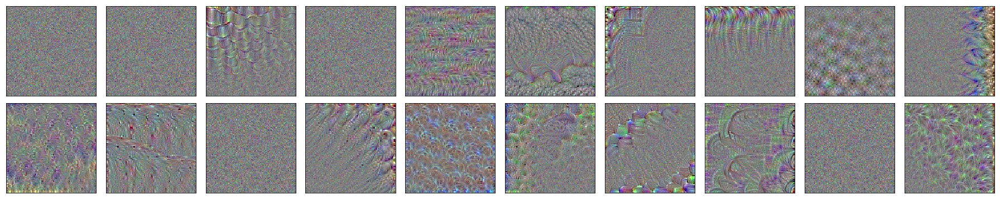

In [13]:
show_filters('block4_conv1', random_img)
show_filters('block4_conv2', random_img)
show_filters('block4_conv3', random_img)

block5_conv1


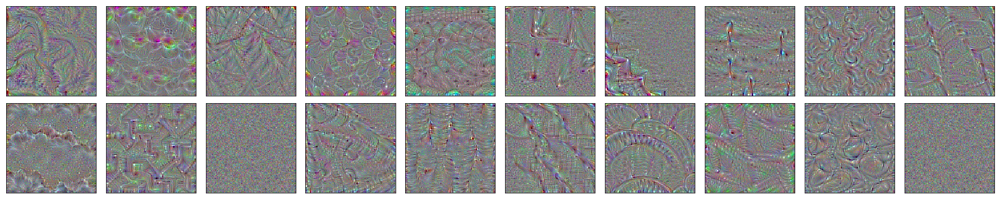

block5_conv2


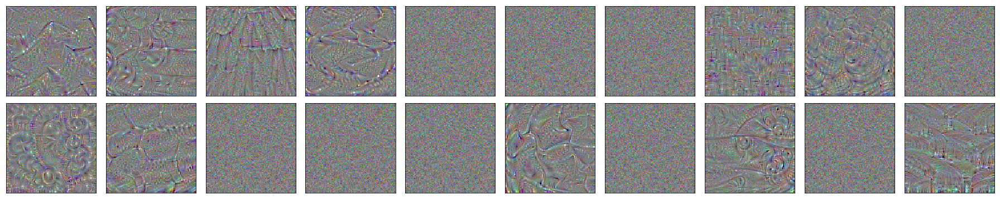

block5_conv3


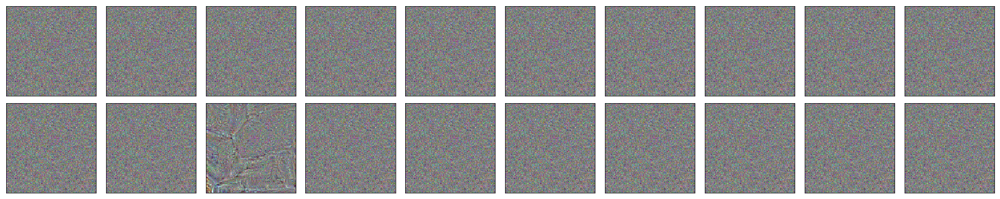

In [14]:
show_filters('block5_conv1', random_img)
show_filters('block5_conv2', random_img)
show_filters('block5_conv3', random_img)

It seems the later layers need more concrete shapes to detect.  As we use a random noise, the filters are not reacting much.

## Little Deep Dreams

If we throw a cat into this experiment and let a filter to nudge the image, what do we get?

This is a similar idea used in **Inceptionism: Going Deeper into Neural Networks** [3].

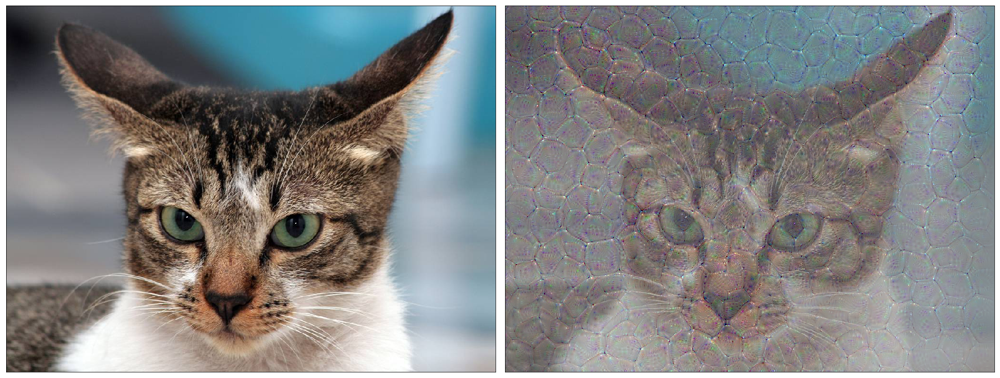

In [15]:
cat_img = plt.imread('../images/cat.835.jpg') # the image source is the reference [4]

result = layer_image(model, layer_name='block5_conv3', filter_index=0, input_img=cat_img, steps=100)

plt.figure(figsize=(25,10))
plt.subplot(121)
plt.imshow(cat_img)
plt.xticks([])
plt.yticks([])
plt.subplot(122)
plt.imshow(result)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()

## Reference:

### [1] Very Deep Convolutional Networks for Large-Scale Image Recognition

Karen Simonyan, Andrew Zisserman

https://arxiv.org/abs/1409.1556

### [2] How convolutional neural networks see the world

Francois Chollet

https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html

### [3] Inceptionism: Going Deeper into Neural Networks

Alexander Mordvintsev, Christopher Olah and Mike Tyka

https://research.googleblog.com/2015/06/inceptionism-going-deeper-into-neural.html

### [4] Dogs vs. Cats Redux: Kernels Edition

https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition